In [1]:
!pip install yfinance
!pip install ffn
!pip install pykalman

In [12]:
import pandas as pd
import pandas_datareader as pdr
from datetime import datetime
import yfinance as yf

def get_historical_Data(tickers):
    """This function returns a pd dataframe with all of the adjusted closing information"""
    data = pd.DataFrame()
    names = list()
    for i in tickers:
        data = pd.concat([data, pd.DataFrame(yf.download(i, start=datetime(2013, 10, 27), end=datetime(2015, 12, 31)).iloc[:,4])], axis = 1)
        names.append(i)
    data.columns = names
    return data

ticks = ["DPZ", "AAPL", "ADBE", "GOOG", "TSLA", "AMD", "GME", "SPY", "NFLX", "BA", 
    "WMT", "GS", "XOM", "NKE", "BRK-B", "MSFT", "AMZN", "META", "NVDA", "JNJ",
    "V", "MA", "UNH", "HD", "PG", "JPM", "KO", "PEP", "LLY", "PFE",
    "CVX", "TMO", "COST", "DIS", "ABT", "MRK", "INTC", "CMCSA", "AVGO", "NVO",
    "ORCL", "CRM", "TXN", "QCOM", "UPS", "PM", "DHR", "LIN", "BMY", "RTX",
    "UNP", "AMT", "LOW", "MDT", "T", "VZ", "HON", "NEE", "ELV", "BAC",
    "IBM", "AMD", "SPGI", "PYPL", "AMGN", "SCHW", "AXP", "BKNG", "BLK", "DE",
    "GE", "PLD", "INTU", "ISRG", "MMM", "MO", "LMT", "SYK", "TJX", "ADI",
    "WM", "C", "CVS", "GILD", "CAT", "DUK", "SO", "CCI", "MS", "MDLZ",
    "TJX", "SBUX", "ZTS", "ADP", "F", "PGR", "CB", "CL", "WM", "TRV"] #Name of company (Dominos pizza)
d = get_historical_Data(ticks)
print(d.shape)
# Most Recent Data
d.tail()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

(548, 100)


,DPZ,AAPL,ADBE,GOOG,TSLA,AMD,GME,SPY,NFLX,BA,...,TJX,SBUX,ZTS,ADP,F,PGR,CB,CL,WM,TRV
Date,,,,,,,,,,,,,,,,,,,,,
2015-12-23,109.349998,26.817499,94.419998,37.673500,15.478667,2.76,7.2000,204.690002,116.910004,143.080002,...,35.465000,60.259998,47.840000,85.389999,14.27,31.930000,117.510002,66.860001,53.410000,112.839996
2015-12-24,109.610001,27.250000,94.449997,37.477501,15.370667,2.88,7.1550,205.720001,118.220001,143.600006,...,35.494999,60.369999,47.860001,85.919998,14.35,31.889999,117.699997,67.000000,53.470001,112.870003
2015-12-28,109.669998,26.897499,93.790001,37.646000,15.432667,2.91,7.0925,204.860001,117.260002,143.259995,...,35.325001,60.020000,47.959999,85.449997,14.28,31.879999,117.940002,66.760002,53.400002,113.000000
2015-12-29,110.400002,26.740000,94.599998,38.334499,15.337333,3.04,7.1550,206.509995,118.190002,145.059998,...,35.570000,60.459999,48.369999,86.500000,14.28,32.189999,118.379997,67.330002,54.020000,114.080002
2015-12-30,112.410004,27.145000,95.190002,38.830002,15.773333,2.99,7.0925,207.110001,118.949997,147.220001,...,35.865002,61.220001,48.330002,86.739998,14.23,32.349998,119.309998,67.660004,54.330002,115.029999


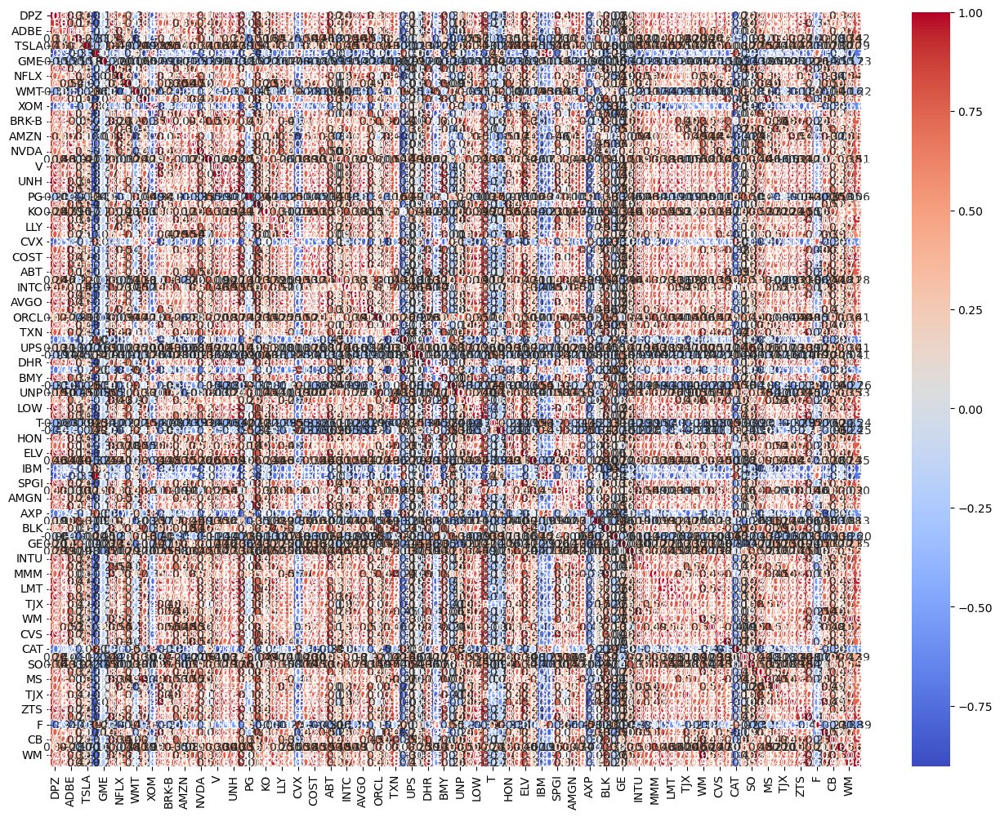

In [15]:
import seaborn as sn
import matplotlib.pyplot as plt

# Calculate the correlation matrix
corr_matrix = d.corr()

# Adjust the figure size and DPI to reasonable values
plt.figure(figsize=(16, 12), dpi=100)

# Plot the heatmap
sn.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm")

# Display the plot
plt.show()


In [17]:
# Extracting pairs with correlation > 0.95
def get_highly_correlated_pairs(corr_matrix, threshold=0.85):
    """Find pairs of tickers with correlation greater than the specified threshold."""
    pairs = []
    for i in range(len(corr_matrix)):
        for j in range(i + 1, len(corr_matrix)):
            if corr_matrix.iloc[i, j] > threshold:
                pairs.append((corr_matrix.index[i], corr_matrix.columns[j], corr_matrix.iloc[i, j]))
    return pairs

high_corr_pairs = get_highly_correlated_pairs(corr_matrix)
for pair in high_corr_pairs:
    print(f"Pair: {pair[0]} and {pair[1]}, Correlation: {pair[2]:.2f}")


Pair: DPZ and AAPL, Correlation: 0.88
Pair: DPZ and ADBE, Correlation: 0.85
Pair: DPZ and NKE, Correlation: 0.89
Pair: DPZ and V, Correlation: 0.92
Pair: DPZ and MA, Correlation: 0.91
Pair: DPZ and UNH, Correlation: 0.98
Pair: DPZ and HD, Correlation: 0.94
Pair: DPZ and LLY, Correlation: 0.94
Pair: DPZ and COST, Correlation: 0.89
Pair: DPZ and DIS, Correlation: 0.93
Pair: DPZ and ABT, Correlation: 0.86
Pair: DPZ and CMCSA, Correlation: 0.85
Pair: DPZ and AVGO, Correlation: 0.95
Pair: DPZ and NVO, Correlation: 0.85
Pair: DPZ and DHR, Correlation: 0.89
Pair: DPZ and BMY, Correlation: 0.93
Pair: DPZ and LOW, Correlation: 0.94
Pair: DPZ and MDT, Correlation: 0.92
Pair: DPZ and HON, Correlation: 0.89
Pair: DPZ and ELV, Correlation: 0.92
Pair: DPZ and SPGI, Correlation: 0.91
Pair: DPZ and AMGN, Correlation: 0.89
Pair: DPZ and INTU, Correlation: 0.91
Pair: DPZ and MO, Correlation: 0.90
Pair: DPZ and LMT, Correlation: 0.90
Pair: DPZ and SYK, Correlation: 0.94
Pair: DPZ and CVS, Correlation: 0.

In [37]:
def find_engle_granger_cointegrated_pairs(dataframe, correlated_pairs, critical_p=0.025):
    """
    Perform Engle-Granger cointegration test on correlated pairs and 
    identify those with p-value < critical_p (indicating cointegration).
    """
    cointegrated_pairs = []
    for stock1, stock2, correlation in correlated_pairs:
        series1 = dataframe[stock1].dropna().values.flatten()  # Ensure 1D array
        series2 = dataframe[stock2].dropna().values.flatten()  # Ensure 1D array

        # Align the lengths of the two series
        min_len = min(len(series1), len(series2))
        series1, series2 = series1[:min_len], series2[:min_len]

        # Perform the Engle-Granger test
        residual_model = sm.OLS(series1, sm.add_constant(series2)).fit()
        residuals = residual_model.resid.flatten()  # Ensure residuals are 1D

        # Conduct Augmented Dickey-Fuller test on residuals
        adf_test = adfuller(residuals, maxlag=1, regression='c', autolag=None)
        p_value = adf_test[1]  # Extract p-value

        if p_value < critical_p:
            cointegrated_pairs.append((stock1, stock2, correlation, p_value))

    return cointegrated_pairs

# Apply the Engle-Granger test on the highly correlated pairs
cointegrated_pairs = find_engle_granger_cointegrated_pairs(d, high_corr_pairs)

# Print the cointegrated pairs
print("\nCointegrated Pairs:")
for pair in cointegrated_pairs:
    print(f"Pair: {pair[0]} and {pair[1]}, Correlation: {pair[2]:.2f}, P-value: {pair[3]:.4f}")



Cointegrated Pairs:
Pair: DPZ and UNH, Correlation: 0.98, P-value: 0.0003
Pair: DPZ and LLY, Correlation: 0.94, P-value: 0.0173
Pair: DPZ and AVGO, Correlation: 0.95, P-value: 0.0200
Pair: DPZ and BMY, Correlation: 0.93, P-value: 0.0061
Pair: DPZ and HON, Correlation: 0.89, P-value: 0.0030
Pair: DPZ and SYK, Correlation: 0.94, P-value: 0.0115
Pair: DPZ and ZTS, Correlation: 0.95, P-value: 0.0059
Pair: AAPL and SPY, Correlation: 0.94, P-value: 0.0028
Pair: AAPL and ABT, Correlation: 0.92, P-value: 0.0185
Pair: AAPL and MDT, Correlation: 0.95, P-value: 0.0119
Pair: AAPL and HON, Correlation: 0.88, P-value: 0.0232
Pair: AAPL and ELV, Correlation: 0.96, P-value: 0.0107
Pair: AAPL and SPGI, Correlation: 0.94, P-value: 0.0215
Pair: ADBE and NKE, Correlation: 0.90, P-value: 0.0172
Pair: ADBE and META, Correlation: 0.95, P-value: 0.0009
Pair: ADBE and NVDA, Correlation: 0.90, P-value: 0.0169
Pair: ADBE and LLY, Correlation: 0.92, P-value: 0.0117
Pair: ADBE and DHR, Correlation: 0.91, P-value:

C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

<Figure size 1400x800 with 0 Axes>

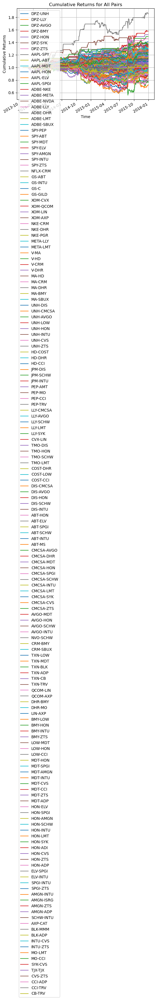

<Figure size 1400x800 with 0 Axes>

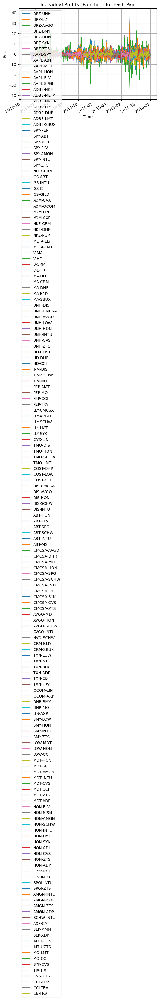

Total PnL for Each Pair:
DPZ-UNH    -43.759204
DPZ-LLY    -32.776486
DPZ-AVGO     0.000000
DPZ-BMY    -16.369683
DPZ-HON     48.636268
              ...    
TJX-TJX      9.187402
CVS-ZTS     10.404814
CCI-ADP    -18.284411
CCI-TRV      3.771865
CB-TRV      -0.475443
Length: 169, dtype: float64


In [47]:
from pykalman import KalmanFilter
import numpy as np
import pandas as pd
from math import sqrt
import matplotlib.pyplot as plt

def KalmanFilterAverage(x):
    # Ensure input is 1-dimensional
    if isinstance(x, (pd.DataFrame, np.ndarray)):
        if len(x.shape) > 1:
            x = x.iloc[:, 0] if isinstance(x, pd.DataFrame) else x[:, 0]
    
    x = pd.Series(x)
    
    kf = KalmanFilter(transition_matrices=[1],
                      observation_matrices=[1],
                      initial_state_mean=0,
                      initial_state_covariance=1,
                      observation_covariance=1,
                      transition_covariance=0.01)
    state_means, _ = kf.filter(x.values)
    return pd.Series(state_means.flatten(), index=x.index)

def KalmanFilterRegression(x, y):
    # Ensure inputs are 1-dimensional numpy arrays
    if isinstance(x, (pd.DataFrame, pd.Series)):
        x = x.values
    if isinstance(y, (pd.DataFrame, pd.Series)):
        y = y.values
        
    if len(x.shape) > 1:
        x = x[:, 0]
    if len(y.shape) > 1:
        y = y[:, 0]
    
    delta = 1e-3
    trans_cov = delta / (1 - delta) * np.eye(2)
    obs_mat = np.expand_dims(np.vstack([x, np.ones(len(x))]).T, axis=1)
    
    kf = KalmanFilter(n_dim_obs=1, n_dim_state=2,
                      initial_state_mean=[0, 0],
                      initial_state_covariance=np.ones((2, 2)),
                      transition_matrices=np.eye(2),
                      observation_matrices=obs_mat,
                      observation_covariance=2,
                      transition_covariance=trans_cov)
    state_means, _ = kf.filter(y)
    return state_means

def half_life(series):
    # Ensure input is 1-dimensional
    if isinstance(series, (pd.DataFrame, np.ndarray)):
        if len(series.shape) > 1:
            series = series.iloc[:, 0] if isinstance(series, pd.DataFrame) else series[:, 0]
    
    series = pd.Series(series)
    lagged = series.shift(1).dropna()
    delta = series.diff().dropna()
    beta = np.polyfit(lagged, delta, 1)[0]
    halflife = -np.log(2) / beta
    return int(max(halflife, 1))

def backtest(s1, s2, x, y):
    # Handle 2D input data
    if isinstance(x, (pd.DataFrame, np.ndarray)) and len(x.shape) > 1:
        x = x.iloc[:, 0] if isinstance(x, pd.DataFrame) else x[:, 0]
    if isinstance(y, (pd.DataFrame, np.ndarray)) and len(y.shape) > 1:
        y = y.iloc[:, 0] if isinstance(y, pd.DataFrame) else y[:, 0]
    
    # Convert to Series with proper index
    if isinstance(x, pd.Series):
        index = x.index
    elif isinstance(y, pd.Series):
        index = y.index
    else:
        index = pd.RangeIndex(len(x))
    
    x = pd.Series(x, index=index)
    y = pd.Series(y, index=index)
    
    # Ensure x and y have the same index
    x, y = x.align(y, join="inner")
    
    # Create a DataFrame with the aligned data
    df1 = pd.DataFrame({'y': y, 'x': x}, index=x.index)
    
    # Apply Kalman Filter regression
    state_means = KalmanFilterRegression(KalmanFilterAverage(x), KalmanFilterAverage(y))
    df1['hr'] = -state_means[:, 0]
    df1['spread'] = df1.y - (df1.x * df1.hr)

    halflife = half_life(df1['spread'])
    meanSpread = df1.spread.rolling(window=halflife).mean()
    stdSpread = df1.spread.rolling(window=halflife).std()
    df1['zScore'] = (df1.spread - meanSpread) / stdSpread

    entryZscore = 2
    exitZscore = 0
    
    # Trading signals
    df1['long entry'] = ((df1.zScore < -entryZscore) & (df1.zScore.shift(1) > -entryZscore))
    df1['long exit'] = ((df1.zScore > -exitZscore) & (df1.zScore.shift(1) < -exitZscore))
    df1['num units long'] = np.nan
    df1.loc[df1['long entry'], 'num units long'] = 1
    df1.loc[df1['long exit'], 'num units long'] = 0
    df1['num units long'].iloc[0] = 0
    df1['num units long'] = df1['num units long'].fillna(method='pad')

    df1['short entry'] = ((df1.zScore > entryZscore) & (df1.zScore.shift(1) < entryZscore))
    df1['short exit'] = ((df1.zScore < exitZscore) & (df1.zScore.shift(1) > exitZscore))
    df1['num units short'] = np.nan
    df1.loc[df1['short entry'], 'num units short'] = -1
    df1.loc[df1['short exit'], 'num units short'] = 0
    df1['num units short'].iloc[0] = 0
    df1['num units short'] = df1['num units short'].fillna(method='pad')

    df1['numUnits'] = df1['num units long'] + df1['num units short']
    df1['spread pct ch'] = (df1['spread'] - df1['spread'].shift(1)) / ((df1['x'] * abs(df1['hr'])) + df1['y'])
    df1['port rets'] = df1['spread pct ch'] * df1['numUnits'].shift(1)
    df1['cum rets'] = df1['port rets'].cumsum() + 1

    # Calculate PnL
    df1['PnL'] = df1['port rets'] * ((df1['x'] * abs(df1['hr'])) + df1['y'])
    total_pnl = df1['PnL'].sum()

    try:
        sharpe = ((df1['port rets'].mean() / df1['port rets'].std()) * sqrt(252))
    except ZeroDivisionError:
        sharpe = 0.0

    return df1['cum rets'], sharpe, df1['PnL'], total_pnl

# Initialize DataFrames for storing results
cumulative_returns_all = pd.DataFrame()
pnls_all = pd.DataFrame()

# Run backtest for each pair
for pair in cointegrated_pairs:
    s1, s2, *_ = pair  # Extract only the first two elements for stock names
    cum_rets, sharpe, pnl, total_pnl = backtest(s1, s2, d[s1], d[s2])
    cumulative_returns_all[f"{s1}-{s2}"] = cum_rets
    pnls_all[f"{s1}-{s2}"] = pnl

# Plotting
plt.figure(figsize=(14, 8))
cumulative_returns_all.plot(title="Cumulative Returns for All Pairs")
plt.xlabel("Time")
plt.ylabel("Cumulative Returns")
plt.grid(True)
plt.show()

plt.figure(figsize=(14, 8))
pnls_all.plot(title="Individual Profits Over Time for Each Pair")
plt.xlabel("Time")
plt.ylabel("PnL")
plt.grid(True)
plt.show()

# Print results
total_pnls = pnls_all.sum()
print("Total PnL for Each Pair:")
print(total_pnls)

In [49]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_individual_returns(cumulative_returns_all):
    """
    Plot cumulative returns for each pair in separate subplots
    """
    n_pairs = len(cumulative_returns_all.columns)
    
    # Calculate number of rows and columns for subplots
    n_cols = 2  # We'll use 2 columns
    n_rows = (n_pairs + 1) // 2  # Calculate rows needed, rounding up
    
    # Create figure with subplots
    fig = plt.figure(figsize=(15, 5*n_rows))
    
    # Plot each pair
    for idx, pair in enumerate(cumulative_returns_all.columns, 1):
        ax = plt.subplot(n_rows, n_cols, idx)
        
        # Plot cumulative returns for this pair
        cumulative_returns_all[pair].plot(ax=ax)
        
        # Customize plot
        ax.set_title(f"Cumulative Returns: {pair}")
        ax.set_xlabel("Time")
        ax.set_ylabel("Returns")
        ax.grid(True)
        
        # Add horizontal line at y=1 (break-even point)
        ax.axhline(y=1, color='r', linestyle='--', alpha=0.3)
    
    plt.tight_layout()
    plt.show()

def analyze_total_pnl(pnls_all):
    """
    Analyze and display total PnL across all pairs
    """
    # Calculate individual pair PnLs
    pair_total_pnls = pnls_all.sum()
    
    # Calculate portfolio total PnL
    portfolio_total_pnl = pair_total_pnls.sum()
    
    # Create cumulative portfolio PnL
    portfolio_cumulative_pnl = pnls_all.sum(axis=1).cumsum()
    
    # Plot cumulative portfolio PnL
    plt.figure(figsize=(15, 6))
    portfolio_cumulative_pnl.plot()
    plt.title("Cumulative Portfolio PnL (All Pairs Combined)")
    plt.xlabel("Time")
    plt.ylabel("Cumulative PnL")
    plt.grid(True)
    plt.axhline(y=0, color='r', linestyle='--', alpha=0.3)
    plt.show()
    
    # Print summary statistics
    print("\nPnL Summary:")
    print("=" * 50)
    print("\nIndividual Pair PnLs:")
    for pair, pnl in pair_total_pnls.items():
        print(f"{pair}: {pnl:,.2f}")
    
    print("\nPortfolio Statistics:")
    print(f"Total Portfolio PnL: {portfolio_total_pnl:,.2f}")
    print(f"Average PnL per Pair: {portfolio_total_pnl/len(pair_total_pnls):,.2f}")
    print(f"Best Performing Pair: {pair_total_pnls.index[pair_total_pnls.argmax()]} ({pair_total_pnls.max():,.2f})")
    print(f"Worst Performing Pair: {pair_total_pnls.index[pair_total_pnls.argmin()]} ({pair_total_pnls.min():,.2f})")
    
    # Calculate additional statistics
    daily_returns = pnls_all.sum(axis=1)
    sharpe_ratio = np.sqrt(252) * daily_returns.mean() / daily_returns.std()
    print(f"Portfolio Sharpe Ratio: {sharpe_ratio:.2f}")
    print(f"Profitable Pairs: {(pair_total_pnls > 0).sum()} out of {len(pair_total_pnls)}")

# Main execution
def visualize_trading_results(cumulative_returns_all, pnls_all):
    """
    Main function to visualize all trading results
    """
    # Plot individual pair returns
    print("Plotting individual pair returns...")
    plot_individual_returns(cumulative_returns_all)
    
    # Analyze and display total PnL
    print("\nAnalyzing PnL...")
    analyze_total_pnl(pnls_all)
    

Running backtests...
Processing pair: DPZ-UNH


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed DPZ-UNH with Sharpe: -0.77
Processing pair: DPZ-LLY


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed DPZ-LLY with Sharpe: -0.57
Processing pair: DPZ-AVGO


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed DPZ-AVGO with Sharpe: nan
Processing pair: DPZ-BMY


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed DPZ-BMY with Sharpe: -0.58
Processing pair: DPZ-HON


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed DPZ-HON with Sharpe: 0.91
Processing pair: DPZ-SYK


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed DPZ-SYK with Sharpe: 0.78
Processing pair: DPZ-ZTS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed DPZ-ZTS with Sharpe: 0.32
Processing pair: AAPL-SPY


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed AAPL-SPY with Sharpe: 1.16
Processing pair: AAPL-ABT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed AAPL-ABT with Sharpe: 0.19
Processing pair: AAPL-MDT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed AAPL-MDT with Sharpe: 0.45
Processing pair: AAPL-HON


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed AAPL-HON with Sharpe: 1.19
Processing pair: AAPL-ELV


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed AAPL-ELV with Sharpe: -0.74
Processing pair: AAPL-SPGI


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed AAPL-SPGI with Sharpe: 0.16
Processing pair: ADBE-NKE


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed ADBE-NKE with Sharpe: nan
Processing pair: ADBE-META


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed ADBE-META with Sharpe: -0.48
Processing pair: ADBE-NVDA


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed ADBE-NVDA with Sharpe: nan
Processing pair: ADBE-LLY


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed ADBE-LLY with Sharpe: -0.66
Processing pair: ADBE-DHR


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed ADBE-DHR with Sharpe: 1.20
Processing pair: ADBE-LMT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed ADBE-LMT with Sharpe: 0.41
Processing pair: ADBE-SBUX


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed ADBE-SBUX with Sharpe: nan
Processing pair: SPY-PEP


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed SPY-PEP with Sharpe: 0.42
Processing pair: SPY-ABT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed SPY-ABT with Sharpe: -0.07
Processing pair: SPY-MDT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed SPY-MDT with Sharpe: -0.04
Processing pair: SPY-ELV


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed SPY-ELV with Sharpe: -0.13
Processing pair: SPY-AMGN


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed SPY-AMGN with Sharpe: -0.25
Processing pair: SPY-INTU


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed SPY-INTU with Sharpe: 0.34
Processing pair: SPY-ZTS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed SPY-ZTS with Sharpe: 0.36
Processing pair: NFLX-CRM


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed NFLX-CRM with Sharpe: 1.76
Processing pair: GS-ABT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed GS-ABT with Sharpe: 0.68
Processing pair: GS-INTU


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed GS-INTU with Sharpe: 0.50
Processing pair: GS-C


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed GS-C with Sharpe: 0.69
Processing pair: GS-GILD


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed GS-GILD with Sharpe: 0.38
Processing pair: XOM-CVX


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed XOM-CVX with Sharpe: -0.60
Processing pair: XOM-QCOM


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed XOM-QCOM with Sharpe: nan
Processing pair: XOM-LIN


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed XOM-LIN with Sharpe: 0.53
Processing pair: XOM-AXP


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed XOM-AXP with Sharpe: -0.17
Processing pair: NKE-CRM


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed NKE-CRM with Sharpe: 0.76
Processing pair: NKE-DHR


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed NKE-DHR with Sharpe: 1.33
Processing pair: NKE-PGR


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed NKE-PGR with Sharpe: -0.33
Processing pair: META-LLY


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed META-LLY with Sharpe: 0.02
Processing pair: META-LMT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed META-LMT with Sharpe: 0.72
Processing pair: V-MA


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed V-MA with Sharpe: 1.09
Processing pair: V-HD


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed V-HD with Sharpe: nan
Processing pair: V-CRM


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed V-CRM with Sharpe: 0.76
Processing pair: V-DHR


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed V-DHR with Sharpe: 1.19
Processing pair: MA-HD


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed MA-HD with Sharpe: nan
Processing pair: MA-CRM


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed MA-CRM with Sharpe: 0.79
Processing pair: MA-DHR


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed MA-DHR with Sharpe: 0.95
Processing pair: MA-BMY


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed MA-BMY with Sharpe: -0.04
Processing pair: MA-SBUX


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed MA-SBUX with Sharpe: nan
Processing pair: UNH-DIS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed UNH-DIS with Sharpe: 0.35
Processing pair: UNH-CMCSA


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed UNH-CMCSA with Sharpe: 0.93
Processing pair: UNH-AVGO


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed UNH-AVGO with Sharpe: nan
Processing pair: UNH-LOW


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed UNH-LOW with Sharpe: nan
Processing pair: UNH-HON


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed UNH-HON with Sharpe: 2.33
Processing pair: UNH-INTU


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed UNH-INTU with Sharpe: 0.35
Processing pair: UNH-CVS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed UNH-CVS with Sharpe: 0.30
Processing pair: UNH-ZTS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed UNH-ZTS with Sharpe: 0.16
Processing pair: HD-COST


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed HD-COST with Sharpe: 0.07
Processing pair: HD-DHR


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed HD-DHR with Sharpe: 0.57
Processing pair: HD-CCI


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed HD-CCI with Sharpe: 1.34
Processing pair: JPM-DIS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed JPM-DIS with Sharpe: -0.19
Processing pair: JPM-SCHW


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed JPM-SCHW with Sharpe: 0.65
Processing pair: JPM-INTU


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed JPM-INTU with Sharpe: 0.54
Processing pair: PEP-AMT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed PEP-AMT with Sharpe: 0.32
Processing pair: PEP-MO


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed PEP-MO with Sharpe: 0.44
Processing pair: PEP-CCI


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed PEP-CCI with Sharpe: 0.56
Processing pair: PEP-TRV


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed PEP-TRV with Sharpe: -0.25
Processing pair: LLY-CMCSA


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed LLY-CMCSA with Sharpe: 0.93
Processing pair: LLY-AVGO


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed LLY-AVGO with Sharpe: nan
Processing pair: LLY-SCHW


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed LLY-SCHW with Sharpe: 0.77
Processing pair: LLY-LMT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed LLY-LMT with Sharpe: -0.09
Processing pair: LLY-SYK


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed LLY-SYK with Sharpe: 0.99
Processing pair: CVX-LIN


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CVX-LIN with Sharpe: 0.43
Processing pair: TMO-DIS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed TMO-DIS with Sharpe: -0.00
Processing pair: TMO-HON


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed TMO-HON with Sharpe: 1.16
Processing pair: TMO-SCHW


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed TMO-SCHW with Sharpe: 0.74
Processing pair: TMO-LMT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed TMO-LMT with Sharpe: -0.18
Processing pair: COST-DHR


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed COST-DHR with Sharpe: 0.91
Processing pair: COST-LOW


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed COST-LOW with Sharpe: nan
Processing pair: COST-CCI


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed COST-CCI with Sharpe: 0.86
Processing pair: DIS-CMCSA


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed DIS-CMCSA with Sharpe: 0.96
Processing pair: DIS-AVGO


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed DIS-AVGO with Sharpe: nan
Processing pair: DIS-HON


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed DIS-HON with Sharpe: 1.12
Processing pair: DIS-SCHW


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed DIS-SCHW with Sharpe: 0.46
Processing pair: DIS-INTU


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed DIS-INTU with Sharpe: 0.67
Processing pair: ABT-HON


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed ABT-HON with Sharpe: 1.09
Processing pair: ABT-ELV


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed ABT-ELV with Sharpe: -0.63
Processing pair: ABT-SPGI


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed ABT-SPGI with Sharpe: -0.21
Processing pair: ABT-SCHW


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed ABT-SCHW with Sharpe: 0.52
Processing pair: ABT-INTU


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed ABT-INTU with Sharpe: 0.26
Processing pair: ABT-MS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed ABT-MS with Sharpe: -0.23
Processing pair: CMCSA-AVGO


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CMCSA-AVGO with Sharpe: nan
Processing pair: CMCSA-DHR


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CMCSA-DHR with Sharpe: 1.11
Processing pair: CMCSA-MDT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CMCSA-MDT with Sharpe: 0.34
Processing pair: CMCSA-HON


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CMCSA-HON with Sharpe: 1.34
Processing pair: CMCSA-SPGI


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CMCSA-SPGI with Sharpe: -0.08
Processing pair: CMCSA-SCHW


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CMCSA-SCHW with Sharpe: 0.90
Processing pair: CMCSA-INTU


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CMCSA-INTU with Sharpe: 0.32
Processing pair: CMCSA-LMT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CMCSA-LMT with Sharpe: -0.22
Processing pair: CMCSA-SYK


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CMCSA-SYK with Sharpe: 0.90
Processing pair: CMCSA-CVS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CMCSA-CVS with Sharpe: 0.08
Processing pair: CMCSA-ZTS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CMCSA-ZTS with Sharpe: 0.06
Processing pair: AVGO-MDT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed AVGO-MDT with Sharpe: 1.61
Processing pair: AVGO-HON


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed AVGO-HON with Sharpe: 0.24
Processing pair: AVGO-SCHW


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed AVGO-SCHW with Sharpe: 0.79
Processing pair: AVGO-INTU


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed AVGO-INTU with Sharpe: 0.58
Processing pair: NVO-SCHW


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed NVO-SCHW with Sharpe: 0.75
Processing pair: CRM-BMY


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CRM-BMY with Sharpe: -0.44
Processing pair: CRM-SBUX


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CRM-SBUX with Sharpe: nan
Processing pair: TXN-LOW


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed TXN-LOW with Sharpe: nan
Processing pair: TXN-MDT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed TXN-MDT with Sharpe: 0.53
Processing pair: TXN-BLK


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed TXN-BLK with Sharpe: 0.51
Processing pair: TXN-ADP


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed TXN-ADP with Sharpe: -0.06
Processing pair: TXN-CB


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed TXN-CB with Sharpe: 0.42
Processing pair: TXN-TRV


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed TXN-TRV with Sharpe: -0.07
Processing pair: QCOM-LIN


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed QCOM-LIN with Sharpe: 0.30
Processing pair: QCOM-AXP


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed QCOM-AXP with Sharpe: 0.91
Processing pair: DHR-BMY


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed DHR-BMY with Sharpe: -0.43
Processing pair: DHR-MO


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed DHR-MO with Sharpe: 0.08
Processing pair: LIN-AXP


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed LIN-AXP with Sharpe: -0.46
Processing pair: BMY-LOW


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed BMY-LOW with Sharpe: nan
Processing pair: BMY-HON


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed BMY-HON with Sharpe: 1.95
Processing pair: BMY-INTU


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed BMY-INTU with Sharpe: -0.05
Processing pair: BMY-ZTS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed BMY-ZTS with Sharpe: 0.18
Processing pair: LOW-MDT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed LOW-MDT with Sharpe: 0.37
Processing pair: LOW-HON


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed LOW-HON with Sharpe: 1.70
Processing pair: LOW-CCI


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed LOW-CCI with Sharpe: 1.16
Processing pair: MDT-HON


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed MDT-HON with Sharpe: 1.24
Processing pair: MDT-SPGI


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed MDT-SPGI with Sharpe: 0.10
Processing pair: MDT-AMGN


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed MDT-AMGN with Sharpe: 0.26
Processing pair: MDT-INTU


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed MDT-INTU with Sharpe: 0.44
Processing pair: MDT-CVS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed MDT-CVS with Sharpe: 0.46
Processing pair: MDT-CCI


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed MDT-CCI with Sharpe: 1.32
Processing pair: MDT-ZTS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed MDT-ZTS with Sharpe: 0.11
Processing pair: MDT-ADP


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed MDT-ADP with Sharpe: -0.08
Processing pair: HON-ELV


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed HON-ELV with Sharpe: -0.72
Processing pair: HON-SPGI


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed HON-SPGI with Sharpe: -0.16
Processing pair: HON-AMGN


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed HON-AMGN with Sharpe: -0.22
Processing pair: HON-SCHW


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed HON-SCHW with Sharpe: 0.84
Processing pair: HON-INTU


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed HON-INTU with Sharpe: 0.71
Processing pair: HON-LMT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed HON-LMT with Sharpe: -0.23
Processing pair: HON-SYK


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed HON-SYK with Sharpe: 0.59
Processing pair: HON-ADI


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed HON-ADI with Sharpe: -0.03
Processing pair: HON-CVS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed HON-CVS with Sharpe: 0.38
Processing pair: HON-ZTS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed HON-ZTS with Sharpe: nan
Processing pair: HON-ADP


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed HON-ADP with Sharpe: -0.21
Processing pair: ELV-SPGI


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed ELV-SPGI with Sharpe: -0.20
Processing pair: ELV-INTU


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed ELV-INTU with Sharpe: 0.14
Processing pair: SPGI-INTU


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed SPGI-INTU with Sharpe: 0.56
Processing pair: SPGI-ZTS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed SPGI-ZTS with Sharpe: 0.45
Processing pair: AMGN-INTU


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed AMGN-INTU with Sharpe: 0.66
Processing pair: AMGN-ISRG


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed AMGN-ISRG with Sharpe: 0.53
Processing pair: AMGN-ZTS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed AMGN-ZTS with Sharpe: 0.11
Processing pair: AMGN-ADP


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed AMGN-ADP with Sharpe: 0.16
Processing pair: SCHW-INTU


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed SCHW-INTU with Sharpe: 0.39
Processing pair: AXP-CAT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed AXP-CAT with Sharpe: nan
Processing pair: BLK-MMM


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed BLK-MMM with Sharpe: -0.15
Processing pair: BLK-ADP


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed BLK-ADP with Sharpe: -0.08
Processing pair: INTU-CVS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed INTU-CVS with Sharpe: -0.04
Processing pair: INTU-ZTS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed INTU-ZTS with Sharpe: 0.31
Processing pair: MO-LMT


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed MO-LMT with Sharpe: 0.07
Processing pair: MO-CCI


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed MO-CCI with Sharpe: 1.66
Processing pair: SYK-CVS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed SYK-CVS with Sharpe: -0.37
Processing pair: TJX-TJX


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed TJX-TJX with Sharpe: 0.32
Processing pair: CVS-ZTS


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CVS-ZTS with Sharpe: 0.51
Processing pair: CCI-ADP


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CCI-ADP with Sharpe: -0.47
Processing pair: CCI-TRV


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CCI-TRV with Sharpe: 0.18
Processing pair: CB-TRV


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

Completed CB-TRV with Sharpe: 0.03

Generating visualizations and analysis...
Plotting individual pair returns...



Analyzing PnL...


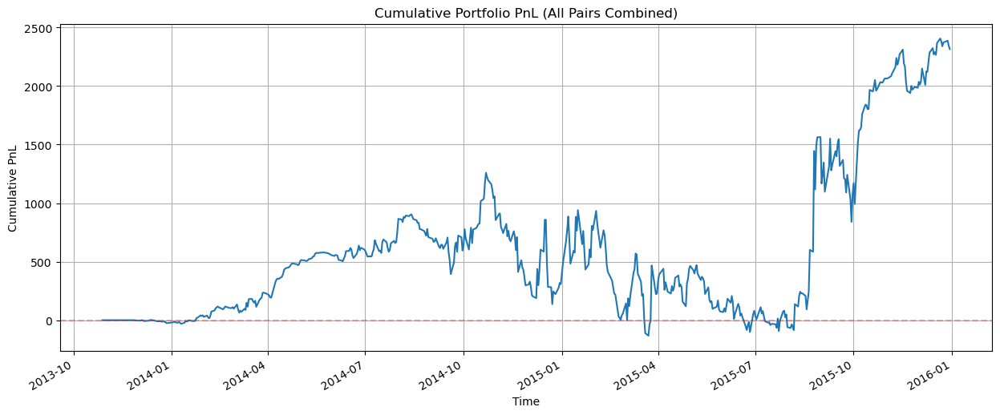


PnL Summary:

Individual Pair PnLs:
DPZ-UNH: -43.76
DPZ-LLY: -32.78
DPZ-AVGO: 0.00
DPZ-BMY: -16.37
DPZ-HON: 48.64
DPZ-SYK: 29.77
DPZ-ZTS: 6.30
AAPL-SPY: 147.74
AAPL-ABT: 5.61
AAPL-MDT: 18.45
AAPL-HON: 78.58
AAPL-ELV: -70.82
AAPL-SPGI: 8.96
ADBE-NKE: 0.00
ADBE-META: -33.98
ADBE-NVDA: 0.00
ADBE-LLY: -37.09
ADBE-DHR: 37.22
ADBE-LMT: 30.24
ADBE-SBUX: 0.00
SPY-PEP: 16.56
SPY-ABT: -2.38
SPY-MDT: -1.86
SPY-ELV: -8.69
SPY-AMGN: -22.32
SPY-INTU: 18.58
SPY-ZTS: 7.89
NFLX-CRM: 101.61
GS-ABT: 14.15
GS-INTU: 26.89
GS-C: 25.84
GS-GILD: 20.91
XOM-CVX: -39.78
XOM-QCOM: 0.00
XOM-LIN: 37.59
XOM-AXP: -2.89
NKE-CRM: 22.37
NKE-DHR: 39.58
NKE-PGR: -7.49
META-LLY: -3.30
META-LMT: 82.17
V-MA: 65.23
V-HD: 0.00
V-CRM: 22.30
V-DHR: 37.26
MA-HD: 0.00
MA-CRM: 22.42
MA-DHR: 28.15
MA-BMY: -1.63
MA-SBUX: 0.00
UNH-DIS: 16.19
UNH-CMCSA: 15.35
UNH-AVGO: 0.00
UNH-LOW: 0.00
UNH-HON: 98.69
UNH-INTU: 18.60
UNH-CVS: 20.60
UNH-ZTS: 2.29
HD-COST: 1.24
HD-DHR: 14.71
HD-CCI: 47.00
JPM-DIS: -11.84
JPM-SCHW: 12.02
JPM-INTU: 30.11

In [51]:
from pykalman import KalmanFilter
import numpy as np
import pandas as pd
from math import sqrt
import matplotlib.pyplot as plt

# First, make sure you have your pairs data
# Assuming you have:
# - cointegrated_pairs: list of tuples containing pairs of stock symbols
# - d: dictionary containing price data for each stock

# Initialize DataFrames for storing results
cumulative_returns_all = pd.DataFrame()
pnls_all = pd.DataFrame()

# Run backtest for each pair
print("Running backtests...")
for pair in cointegrated_pairs:
    s1, s2, *_ = pair  # Extract only the first two elements for stock names
    print(f"Processing pair: {s1}-{s2}")
    
    try:
        cum_rets, sharpe, pnl, total_pnl = backtest(s1, s2, d[s1], d[s2])
        cumulative_returns_all[f"{s1}-{s2}"] = cum_rets
        pnls_all[f"{s1}-{s2}"] = pnl
        print(f"Completed {s1}-{s2} with Sharpe: {sharpe:.2f}")
    except Exception as e:
        print(f"Error processing {s1}-{s2}: {str(e)}")
        continue

# Run visualization and analysis
if not cumulative_returns_all.empty and not pnls_all.empty:
    print("\nGenerating visualizations and analysis...")
    try:
        visualize_trading_results(cumulative_returns_all, pnls_all)
    except Exception as e:
        print(f"Error in visualization: {str(e)}")
else:
    print("No data available for visualization. Please check your backtest results.")

# Save results to CSV (optional)
try:
    timestamp = pd.Timestamp.now().strftime("%Y%m%d_%H%M%S")
    cumulative_returns_all.to_csv(f'cumulative_returns_{timestamp}.csv')
    pnls_all.to_csv(f'pnls_{timestamp}.csv')
    print(f"\nResults saved to CSV files with timestamp {timestamp}")
except Exception as e:
    print(f"Error saving results to CSV: {str(e)}")

In [53]:
import pandas as pd
import numpy as np

def analyze_profit_loss(pnls_all):
    """
    Analyze profit and loss, compute total profits and losses, and calculate Sharpe ratios.
    """
    # Separate profit and loss bearing pairs
    pair_total_pnls = pnls_all.sum()
    profit_pairs = pair_total_pnls[pair_total_pnls > 0]
    loss_pairs = pair_total_pnls[pair_total_pnls <= 0]
    
    # Calculate total profits and losses
    total_profits = profit_pairs.sum()
    total_losses = loss_pairs.sum()
    
    # Create daily returns for Sharpe ratio calculation
    daily_returns_profits = pnls_all[profit_pairs.index].sum(axis=1)
    daily_returns_losses = pnls_all[loss_pairs.index].sum(axis=1)
    
    # Sharpe ratios
    sharpe_ratio_profits = (
        np.sqrt(252) * daily_returns_profits.mean() / daily_returns_profits.std()
        if not daily_returns_profits.empty and daily_returns_profits.std() > 0 else 0
    )
    sharpe_ratio_losses = (
        np.sqrt(252) * daily_returns_losses.mean() / daily_returns_losses.std()
        if not daily_returns_losses.empty and daily_returns_losses.std() > 0 else 0
    )
    
    # Display results
    print("Profit and Loss Analysis:")
    print("=" * 50)
    print(f"Total Profits: {total_profits:,.2f}")
    print(f"Total Losses: {total_losses:,.2f}")
    print("\nProfit Pairs:")
    for pair, pnl in profit_pairs.items():
        print(f"{pair}: {pnl:,.2f}")
    print("\nLoss Pairs:")
    for pair, pnl in loss_pairs.items():
        print(f"{pair}: {pnl:,.2f}")
    
    print(f"\nSharpe Ratio (Profits): {sharpe_ratio_profits:.2f}")
    print(f"Sharpe Ratio (Losses): {sharpe_ratio_losses:.2f}")
    
    return profit_pairs, loss_pairs, total_profits, total_losses, sharpe_ratio_profits, sharpe_ratio_losses

# Example usage
# Assuming `pnls_all` is a DataFrame with daily PnL data for each pair
# Example: pnls_all = pd.DataFrame({'pair1': [...], 'pair2': [...]}, index=[...])

profit_pairs, loss_pairs, total_profits, total_losses, sharpe_profits, sharpe_losses = analyze_profit_loss(pnls_all)


Profit and Loss Analysis:
Total Profits: 3,057.42
Total Losses: -742.13

Profit Pairs:
DPZ-HON: 48.64
DPZ-SYK: 29.77
DPZ-ZTS: 6.30
AAPL-SPY: 147.74
AAPL-ABT: 5.61
AAPL-MDT: 18.45
AAPL-HON: 78.58
AAPL-SPGI: 8.96
ADBE-DHR: 37.22
ADBE-LMT: 30.24
SPY-PEP: 16.56
SPY-INTU: 18.58
SPY-ZTS: 7.89
NFLX-CRM: 101.61
GS-ABT: 14.15
GS-INTU: 26.89
GS-C: 25.84
GS-GILD: 20.91
XOM-LIN: 37.59
NKE-CRM: 22.37
NKE-DHR: 39.58
META-LMT: 82.17
V-MA: 65.23
V-CRM: 22.30
V-DHR: 37.26
MA-CRM: 22.42
MA-DHR: 28.15
UNH-DIS: 16.19
UNH-CMCSA: 15.35
UNH-HON: 98.69
UNH-INTU: 18.60
UNH-CVS: 20.60
UNH-ZTS: 2.29
HD-COST: 1.24
HD-DHR: 14.71
HD-CCI: 47.00
JPM-SCHW: 12.02
JPM-INTU: 30.11
PEP-AMT: 13.47
PEP-MO: 4.29
PEP-CCI: 16.76
LLY-CMCSA: 13.73
LLY-SCHW: 12.57
LLY-SYK: 45.11
CVX-LIN: 36.25
TMO-HON: 62.08
TMO-SCHW: 12.30
COST-DHR: 20.78
COST-CCI: 30.23
DIS-CMCSA: 15.86
DIS-HON: 55.17
DIS-SCHW: 8.76
DIS-INTU: 31.10
ABT-HON: 56.00
ABT-SCHW: 8.38
ABT-INTU: 14.78
CMCSA-DHR: 29.23
CMCSA-MDT: 10.88
CMCSA-HON: 63.26
CMCSA-SCHW: 15.13

C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df1['num units long'].iloc[0] = 0
C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\3198112895.py:106: SettingWithCopyWarning:

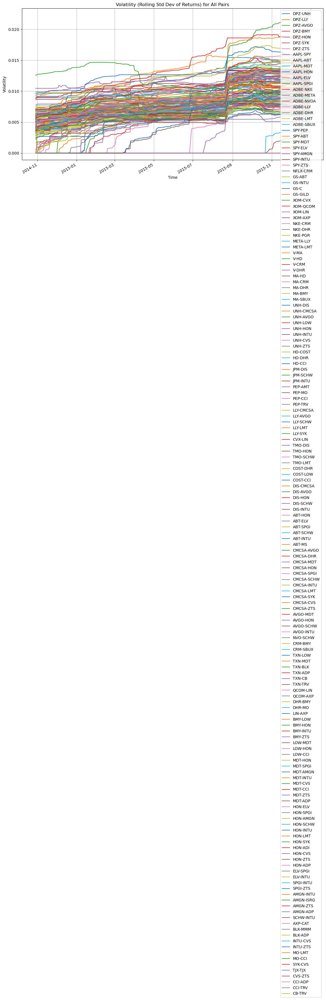

Average Volatility for Each Pair:
DPZ-UNH     0.010818
DPZ-LLY     0.007922
DPZ-AVGO    0.000000
DPZ-BMY     0.008233
DPZ-HON     0.006513
              ...   
TJX-TJX     0.011557
CVS-ZTS     0.005178
CCI-ADP     0.008878
CCI-TRV     0.004232
CB-TRV      0.005981
Length: 169, dtype: float64


In [55]:
def calculate_volatility(returns, window=252):
    """
    Calculate volatility as the rolling standard deviation of returns.
    
    Parameters:
        returns (pd.Series): A series of returns.
        window (int): The rolling window size (default 252, typical for annualized returns).
    
    Returns:
        pd.Series: Rolling standard deviation (volatility) of the returns.
    """
    volatility = returns.rolling(window=window).std()
    return volatility

# DataFrame to store volatilities for all pairs
volatilities_all = pd.DataFrame()

# Calculate volatility for each pair
window_size = 252  # One-year rolling window (assuming daily data)
for pair in cointegrated_pairs:
    s1, s2, *_ = pair
    cum_rets, sharpe, pnl, total_pnl = backtest(s1, s2, d[s1], d[s2])
    vol = calculate_volatility(cum_rets.pct_change(), window=window_size)
    volatilities_all[f"{s1}-{s2}"] = vol

# Plot Volatility for All Pairs
volatilities_all.plot(figsize=(14, 8), title="Volatility (Rolling Std Dev of Returns) for All Pairs")
plt.xlabel("Time")
plt.ylabel("Volatility")
plt.grid()
plt.show()

# Print Average Volatility for Each Pair
average_volatility = volatilities_all.mean()
print("Average Volatility for Each Pair:")
print(average_volatility)


C:\Users\shubh\AppData\Local\Temp\ipykernel_45788\140014109.py:26: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.21500979 0.09453034 0.05836621 0.0097779  0.00846244 0.00777446
 0.006521   0.0063548  0.00619444 0.00603409 0.00584334 0.00571396
 0.00570411 0.00563818 0.00560617 0.00552195 0.00551801 0.00551536
 0.00550105 0.00543    0.00533136 0.00525138 0.00524139 0.00523702
 0.00523597 0.0052328  0.00521796 0.00513463 0.00512796 0.00512484
 0.00511208 0.00510326 0.00506213 0.00505185 0.00503593 0.00499063
 0.00498051 0.00496815 0.00495933 0.00495525 0.00495056 0.00492944
 0.00484355 0.00484133 0.00483339 0.00482742 0.00482046 0.00482024
 0.00477829 0.00474653 0.00467974 0.00465364 0.00458846 0.00456214
 0.00453667 0.00450576 0.00450107 0.00450054 0.00449999 0.00446094
 0.0044381  0.00443192 0.00439769 0.00437911 0.00436013 0.00432899
 0.00430853 0.00429994 0.00428777 0.00427463 0.00425509 0.0042456
 

Stocks Sorted by Average Volatility (Ascending):
MA-HD       0.000000
AXP-CAT     0.000000
LLY-AVGO    0.000000
UNH-LOW     0.000000
MA-SBUX     0.000000
              ...   
CRM-BMY     0.011864
HON-AMGN    0.012017
MDT-AMGN    0.012923
AMGN-ZTS    0.013580
AAPL-ELV    0.013900
Length: 169, dtype: float64

Assigned Weights (Higher for Lower Volatility, Zero for Below Threshold):
MA-HD       0.000000
AXP-CAT     0.000000
LLY-AVGO    0.000000
UNH-LOW     0.000000
MA-SBUX     0.000000
              ...   
CRM-BMY     0.002773
HON-AMGN    0.002738
MDT-AMGN    0.002546
AMGN-ZTS    0.002423
AAPL-ELV    0.002367
Length: 169, dtype: float64


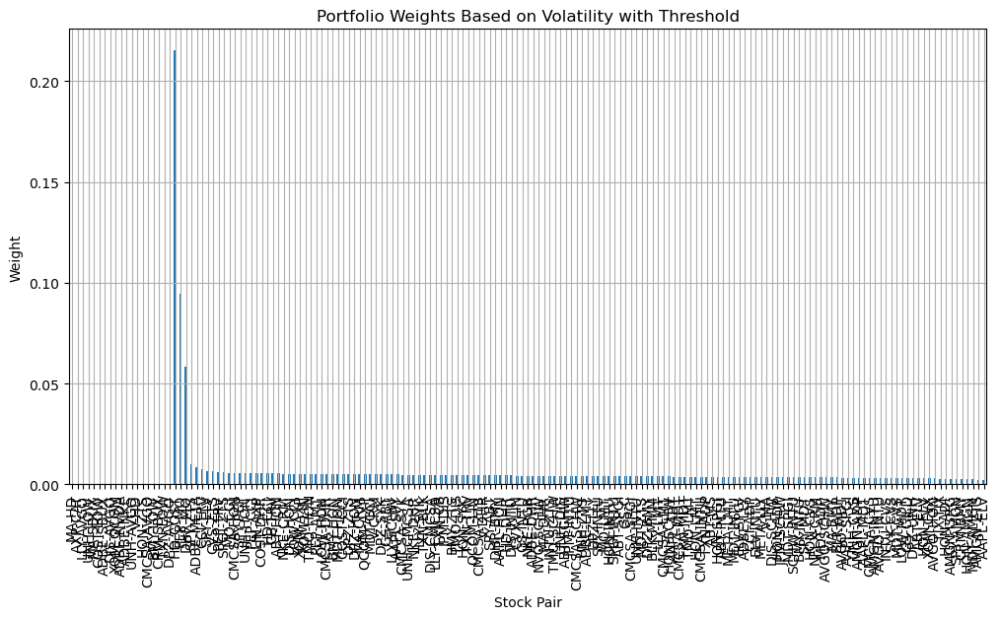

In [59]:
# Function to calculate weights based on average volatility
def calculate_weights_with_threshold(average_volatility, threshold=1e-9):
    """
    Calculate weights for stocks based on inverse of average volatility.
    Stocks with volatility below the threshold are assigned a weight of zero.
    
    Parameters:
        average_volatility (pd.Series): Series of average volatilities for each stock pair.
        threshold (float): Volatility threshold below which stocks are given zero weight.
    
    Returns:
        pd.Series: Weights for each stock pair, normalized to sum to 1 (excluding zero-weight stocks).
    """
    # Assign zero weight to stocks with volatility below the threshold
    filtered_volatility = average_volatility.copy()
    filtered_volatility[filtered_volatility < threshold] = 0

    # Calculate inverse volatility for stocks above the threshold
    inverse_volatility = 1 / filtered_volatility[filtered_volatility >= threshold]

    # Normalize weights to sum to 1
    weights = inverse_volatility / inverse_volatility.sum()

    # Set weights of zero for stocks below the threshold
    all_weights = pd.Series(0, index=average_volatility.index)
    all_weights.update(weights)
    
    return all_weights

# Sort stocks by average volatility in ascending order
sorted_volatility = average_volatility.sort_values()

# Calculate weights, applying the threshold
weights_with_threshold = calculate_weights_with_threshold(sorted_volatility)

# Display sorted volatilities and their respective weights
print("Stocks Sorted by Average Volatility (Ascending):")
print(sorted_volatility)

print("\nAssigned Weights (Higher for Lower Volatility, Zero for Below Threshold):")
print(weights_with_threshold)

# Visualize weights
weights_with_threshold.plot(kind='bar', figsize=(12, 6), title="Portfolio Weights Based on Volatility with Threshold")
plt.xlabel("Stock Pair")
plt.ylabel("Weight")
plt.grid()
plt.show()
